## LIKE PREDICTION & CLUSTERING OF DINING SITES IN INDIAN METRO CITIES

Srichandan Dash\
Capstone Project\
IBM Data Science Professional Certificate

### 1. INTRODUCTION
<br>
<div style="text-align: justify"> 
India boasts an incredibly diverse collection of restaurants catering to different palettes and appetites. A large part of marketing for a modern restaurant (or any company) is social media, where the number of "likes" that the company can receive will dictate its brand and image to the public. For a new food business owner (or existing company) to open a new restaurant in India, knowing ahead of time the potential social media image they can have would provide an excellent solution to the ever-present business problem of uncertainty. In this case the uncertainty is regarding performance of social media presence.
</div>
<br>
<div style="text-align: justify">
We can mitigate this uncertainty through leveraging data gathered from FourSquare's API, specifically, we are able to scrape "likes" data of different restaurants directly from the API as well as their location and category of cuisine. The question we will try to address is, how accurately can we predict the amount of "likes" a new restaurant opening in this region can expect to have based on the type of cuisine it will serve and which city in India it will open in. (For the purposes of this analysis, we will contain the geographical scope of analysis to thirteen heavily populated metro cities in India, namely Delhi, Mumbai, Kolkata, Chennai, Bangalore, Hyderabad, Pune, Visakhapatnam, Kanpur, Surat, Patna, Jaipur, Nagpur).
</div>
<br>
<div style="text-align: justify">
Leveraging this data will solve the problem as it allows the new business owner (or existing company) to make pre-emptive business decisions regarding opening the restaurant in terms of whether it is feasible to open one in this region and expect good social media presence, what type of cuisine and which city of three would be the best. This project will analyse and model the data via machine learning through comparing regression, logistic regression and Support Vector Machines to see which method will yield better predictive capabilities after training and testing. An additional aspect of the project also includes CLUSTERING of existing restaurants in these cities which can help an existing owner decide which city is most like his present city and where can he get similar public response if he decides to build a new restaurant there. 
</div>



<i>Importing Necessary Packages</i>

In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import jaccard_score, classification_report
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


<i>Configurations for FOURSQUARE API and list of Metro Cities</i>

In [2]:
CLIENT_ID = 'WQ4FPEP2HWUUTPKHKUJVHLY2T5TY30AZYST2VS3SY5NKQVHJ' 
CLIENT_SECRET = '0JDDISIP3PA2A4Y2ZBPPIPFDHNV3LWPNWEMITKGAWCP455J1'
VERSION = '20180605' # Foursquare API version
LIMIT = 500 # limit of number of venues returned by Foursquare API
radius = 10000 # define radius
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

address_list = [
    'Delhi, India', 
    'Mumbai, India', 
    'Kolkata, India',
    'Chennai, India',
    'Banglore, India',
    'Hyderabad, India',
    'Pune, India',
    'Visakhapatnam, India',
    'Kanpur, India',
    'Surat, India',
    'Patna, India',
    'Jaipur, India',
    'Nagpur, India']

Your credentails:
CLIENT_ID: WQ4FPEP2HWUUTPKHKUJVHLY2T5TY30AZYST2VS3SY5NKQVHJ
CLIENT_SECRET:0JDDISIP3PA2A4Y2ZBPPIPFDHNV3LWPNWEMITKGAWCP455J1


### 2. DATA - Scrapping, Cleaning and Preparation

<div style="text-align: justify"> 
In this section we will first retrieve the geographical coordinates of the thirteen metro cities. Then, we will leverage the FourSquare API to obtain URLs that lead to the raw data in JSON form. We will speerately scrape the raw data in these URLs in order to retrieve the following columns: "Venue_Name", "Category", "Latitude", "Longitude". and "id" for each city. We can also provide another column ("Metro_City_Name") to indicate which city the restaurants are from.
</div>
<br>
<div style="text-align: justify"> 
It is important to note that the extracts are not of every restaurant in those cities but rather all of the restaurants within a 10000KM range of the geographical coordinates that geolocator was able to provide. However, the extraction from the FourSquare API actually obtains venue data so it will include venues other than restaurants such as concert halls, stores, libraries etc. As such, this means that the data will need to be further cleaned somewhat manually by removing all of the non-restaurant rows. Once this is complete, we have a shortened by cleaned list to pull "likes" data. The reason the cleaning takes precedence is mainly that pulling the "likes" data is the computing process which takes the longest time in this project so we want to make sure we are not pulling information that will end up being dropped anyways.
</div>
<br>
<div style="text-align: justify"> 
The "id" is an important column as it will allow us to further pull the "likes" from the API. We can retreive the "likes" based on the restaurant "id" and then append it to the data frame. Once this is complete, we finally name the dataframe 'raw_dataset' as it is the most complete compiled form before needing any processing for analysis via machine learning.
</div>

In [3]:
venues_list = []

for i in range(len(address_list)):
    
    print(address_list[i])
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address_list[i])
    latitude = location.latitude
    longitude = location.longitude
    print('The geograpical coordinate of {} are {}, {}.'.format(address_list[i].split(",")[0], latitude, longitude))
    
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
    
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    venues_list.append([(
            v['venue']['id'], 
            v['venue']['name'], 
            v['venue']['categories'][0]['name'],
            v['venue']['location']['lat'],
            v['venue']['location']['lng'],
            address_list[i]) for v in results])
    
    print("List updated for {}.".format(address_list[i].split(",")[0]))

nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])

Delhi, India
The geograpical coordinate of Delhi are 28.6517178, 77.2219388.
List updated for Delhi.
Mumbai, India
The geograpical coordinate of Mumbai are 19.0759899, 72.8773928.
List updated for Mumbai.
Kolkata, India
The geograpical coordinate of Kolkata are 22.5726723, 88.3638815.
List updated for Kolkata.
Chennai, India
The geograpical coordinate of Chennai are 13.0836939, 80.270186.
List updated for Chennai.
Banglore, India
The geograpical coordinate of Banglore are 12.5287523, 78.210298.
List updated for Banglore.
Hyderabad, India
The geograpical coordinate of Hyderabad are 17.360589, 78.4740613.
List updated for Hyderabad.
Pune, India
The geograpical coordinate of Pune are 18.521428, 73.8544541.
List updated for Pune.
Visakhapatnam, India
The geograpical coordinate of Visakhapatnam are 17.7231276, 83.3012842.
List updated for Visakhapatnam.
Kanpur, India
The geograpical coordinate of Kanpur are 26.4609135, 80.3217588.
List updated for Kanpur.
Surat, India
The geograpical coordi

In [4]:
nearby_venues.columns = ['id', 
                  'Venue_Name', 
                  'Category', 
                  'Latitude', 
                  'Longitude',
                  'Metro_City_Name']

<i>DATASET after extracting Venunes</i>

In [5]:
nearby_venues.to_csv('Nearby_Venues.csv')
nearby_venues.head()

,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name
0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India"
1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India"
2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India"
3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India"
4,4fe1cd59e4b00017d7fcbd78,Jolly Creations Designer Boutique,Boutique,28.662689,77.226300,"Delhi, India"


In [12]:
def func(a):
    return str(a).split('/')[0].strip(" ")

nearby_venues["Category"] = nearby_venues["Category"].apply(func)

<i>We will be keeping only the FOOD DINING type of venues and reject the rest.</i>

In [13]:
count = 0
vals = ['Restaurant', 'Sandwich', 'Breakfast', 'Food', 'Snack', 'Pizza', 'Salad', 'Vegetarian', 'Dhaba', 'Indian Sweet Shop',
        'Pub','Diner', 'Chicken', 'Burger', 'BBQ', 'Chaat', 'Caf', 'Ice Cream', 'Hotel', 'Bakery', 'Dessert Shop', 'Bar',
        'Bistro', 'Juice Bar', 'Hotel Bar', 'Plaza', 'Lounge', 'Tea Room']

removal_list = [''] 
for x in nearby_venues['Category']:
    test = 0
    for y in vals:
        if y in x:
            test = test + 1
    
    if test > 0:
        count = count + 1
    else:
        removal_list.append(x)
        
removal_list.append('Gaming Cafe')

In [15]:
nearby_venues = nearby_venues[~nearby_venues['Category'].isin(removal_list)]

<i>Count of Restaurants of each type</i>

In [16]:
nearby_venues['Category'].value_counts().head()

Indian Restaurant    110
Hotel                 69
Café                  62
Bakery                32
Ice Cream Shop        29
Name: Category, dtype: int64

In [17]:
nearby_venues.shape

(673, 6)

<i>Extracting LIKES for each Venue using ID</i>

In [18]:
likes_list = []
count = 1
for idx in nearby_venues['id']:
    venue_url = 'https://api.foursquare.com/v2/venues/{}/likes?client_id={}&client_secret={}&v={}'.format(idx, CLIENT_ID, CLIENT_SECRET, VERSION)
    
    try:
        result = requests.get(venue_url).json()['response']['likes']['count']
        likes_list.append(result)
    except:
        print("Error")
        result = -1
        
    count = count+1

In [19]:
nearby_venues['Likes'] = likes_list
nearby_venues.to_csv('Nearby_Venues.csv')
nearby_venues.head()

<ipython-input-19-94b20b24d385>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nearby_venues['Likes'] = likes_list


,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes
0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India",7
1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India",48
2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India",815
3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India",317
5,4bc8f2c7762beee1a8bb3d38,The Imperial,Hotel,28.625548,77.218664,"Delhi, India",114


### 2.1 DATA - Further Preparation

<div style="text-align: justify"> 
The data still needs some more processing before it is suitable for model training and testing. Mainly, the "categories" column contains too many different types of cuisines to allow a model to yield any meaningful results. However, the different types of natural cuisines have natural groupings based on conventionally accepted cultural groupings of cuisine. Broadly speaking, all the different types of cuisine could be reclassified as European, Latin American, Asian, Regional, North American, or casual establishments such as coffee shops or ice cream parlours. We can implement manual classification as there really are not that many different types of cuisines.
</div>
<br>
<div style="text-align: justify"> 
As this project will compare linear regression, logistic regression and SVM classifier, it makes sense to have "likes" as both a continuous and categorical (but ordinal) variable. In the case of turning into a categorical variable, we can bin the data based on percentiles and classify them into these ordinal percentile categories. I tried different ways of binning but in the end, splitting the sample into three different bins proved to yield the best classification results from a prediction standpoint.
</div>
<br>
<div style="text-align: justify"> 
As the last stage of data preparation, it is important to note that the regressors are categorical variables (13 different cities and 6 different categories of cuisines). Hence, they require dummy variable encoding for meaningful analysis. We can accomplish this via one-hot encoding. The encoding part will be done during machine learning analysis.
</div>
<br>

<i>Creating Manual Categories for the dining points and grouping them accordingly for a better categorical variable</i>

In [28]:
euro = ["Spanish Restaurant","Modern European Restaurant", "German Restaurant", "Mediterranean Restaurant", "French Restaurant",
        "Pizza Place", "Italian Restaurant", ]

latino = ["English Restaurant", "Brazilian Restaurant"]

asian = ["Indian Restaurant", "Japanese Restaurant", "Indian Chinese Restaurant", "Falafel Restaurant", "Kebab Restaurant", "Middle Eastern Restaurant",
         "Tibetan Restaurant", "Mughlai Restaurant", "Asian Restaurant", "Chinese Restaurant"]

regional = ["Karnataka Restaurant", "Northeast Indian Restaurant", "Punjabi Restaurant",
          "Hyderabadi Restaurant", "Andhra Restaurant", "Awadhi Restaurant","Multicuisine Indian Restaurant", "Bengali Restaurant",
         "Dhaba", "North Indian Restaurant",  "South Indian Restaurant"]

casual = ["Café", "Ice Cream Shop", "Salad Place", "Irani Cafe","Food & Drink Shop", "Bed & Breakfast", "Bar", "Pub", "Bakery"
          "Molecular Gastronomy Restaurant", "Food", "Cafeteria", "Chaat Place", "Food Court", "Burger Joint", "Food Truck", 
           "Breakfast Spot", "Diner", "Vegetarian","Sandwich Place", "Snack Place", "Fast Food Restaurant", "Lounge", "Dessert Shop"
           "Juice Bar", "Tea Room", "Hookah Bar", "Plaza", "Cocktail Bar", "Hotel Bar"]

american = ["Dumpling Restaurant", "Fried Chicken Joint", "Seafood Restaurant", "American Restaurant", "BBQ Joint","Restaurant", "Bistro"]

def categorize_restaurants(df):
    
    if df['Category'] in euro:
        return 'euro'
    if df['Category'] in latino:
        return 'latino'
    if df['Category'] in regional:
        return 'regional'
    if df['Category'] in asian:
        return 'asian'
    if df['Category'] in american:
        return 'american'
    
    return 'casual'


nearby_venues['categories_classified'] = nearby_venues.apply(categorize_restaurants, axis=1)
nearby_venues.head()

<ipython-input-28-c291b5a805fa>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nearby_venues['categories_classified'] = nearby_venues.apply(categorize_restaurants, axis=1)


,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes,categories_classified
0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India",7,casual
1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India",48,casual
2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India",815,casual
3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India",317,asian
5,4bc8f2c7762beee1a8bb3d38,The Imperial,Hotel,28.625548,77.218664,"Delhi, India",114,casual


In [29]:
nearby_venues = nearby_venues.reset_index()
nearby_venues.groupby("categories_classified").count()

,index,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes
categories_classified,,,,,,,,
american,51,51,51,51,51,51,51,51
asian,158,158,158,158,158,158,158,158
casual,391,391,391,391,391,391,391,391
euro,42,42,42,42,42,42,42,42
latino,2,2,2,2,2,2,2,2
regional,29,29,29,29,29,29,29,29


<i>Classifying the likes into different ranking levels. We determine 3 rankings by binning based on percentiles</i>

In [344]:
# classify the likes into different ranking levels
# Determine 2 rankings by binning based on percentiles

thres1 = np.percentile(nearby_venues['Likes'], 50)

ranklist = []

for l in nearby_venues['Likes']:
    if l > thres1:
        ranklist.append(1)
    if l <= thres1:
        ranklist.append(0)

nearby_venues['ranking_2'] = ranklist
nearby_venues.head()

,Cluster Labels,index,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes,categories_classified,newLikes,ranking_2
0,1,0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India",7,casual,-0.495028,0
1,1,1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India",48,casual,0.135247,1
2,1,2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India",815,casual,11.925996,1
3,2,3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India",317,asian,4.270464,1
4,1,5,4bc8f2c7762beee1a8bb3d38,The Imperial,Hotel,28.625548,77.218664,"Delhi, India",114,casual,1.149835,1


In [345]:
# classify the likes into different ranking levels
# Determine 3 rankings by binning based on percentiles

thres1 = np.percentile(nearby_venues['Likes'], 33)
thres2 = np.percentile(nearby_venues['Likes'], 66)

ranklist = []

for l in nearby_venues['Likes']:
    if l > thres2:
        ranklist.append(2)
    if l > thres1 and l <= thres2:
        ranklist.append(1)
    if l <= thres1:
        ranklist.append(0)

nearby_venues['ranking_3'] = ranklist
nearby_venues.head()

,Cluster Labels,index,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes,categories_classified,newLikes,ranking_2,ranking_3
0,1,0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India",7,casual,-0.495028,0,0
1,1,1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India",48,casual,0.135247,1,2
2,1,2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India",815,casual,11.925996,1,2
3,2,3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India",317,asian,4.270464,1,2
4,1,5,4bc8f2c7762beee1a8bb3d38,The Imperial,Hotel,28.625548,77.218664,"Delhi, India",114,casual,1.149835,1,2


### 3. METHODOLOGY

<div style="text-align: justify"> 
For analysis of teh data we will use Seaborn and Matplotlib. We will be using Folium for plotting maps. Expoloratory analsis done involves comparison between averge likes and category, count of dining sites and city, average likes and city. Inferences drwan from these are explained in further sections. After this regression and clustering are implemented.
</div>
<br>
<div style="text-align: justify"> 
The clustering of the dining venues will be done via K Means Clustering. We will be using the Sci-Kit Learn Package for the same. In the Clustering section we will use the categories and likes of each venue to assign them a cluster. Thus, the ONE HOT ENCODED venue category will be utilized for K means clustering. 
</div>
<br>
<div style="text-align: justify"> 
This project will utilize both linear and logistic regression machine learning methods to train and test the data. Namely, linear regression will be used to predict the number of "likes" a new restaurant in this region will have. We will utilize the Sci-Kit Learn Package to run the model.
</div>
<br>
<div style="text-align: justify"> 
We can also utilize logistic regression as a classification method rather than direct prediction of the number of likes. Since the number of "likes" can be binned into different categories based on different percentile bins, it is also potentially possible to see which range of "likes" a new restaurant in this region will have.
</div>
<br>
<div style="text-align: justify"> 
Since the "likes" are binned into multiple (more than 2) categories, the type of logistic regression will be multinomial. Additionally, although the ranges are indeed discrete categories, they are also ordinal in nature. Therefore, the logistic regression will need to be specified as being both multinomial and ordinal. This can be done through the Sci-Kit Learn Package as well. The SVM will also be implemented via Sci-Kit Learn Package and a rbf kernel is used.
</div>
<br>

#### 3.1 Exploratory Analysis

<i>Generating MAPS for each city with marked Venues</i>

In [287]:
def generateMap(address):
    
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    print('The geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))

    map_gen = folium.Map(location=[latitude, longitude], zoom_start=11)

    # add markers to map
    for lat, lng, label, place in zip(nearby_venues['Latitude'], nearby_venues['Longitude'], nearby_venues['Venue_Name'], nearby_venues['Metro_City_Name']):
        if address == place:
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=5,
                popup=label,
                color='blue',
                fill=True,
                fill_color='#3186cc',
                fill_opacity=0.7,
                parse_html=False).add_to(map_gen)  

    display(map_gen)

In [288]:
for address in address_list:
    print('MAP FOR {}'.format(address))
    generateMap(address)

MAP FOR Delhi, India
The geograpical coordinate of Delhi, India are 28.6517178, 77.2219388.


MAP FOR Mumbai, India
The geograpical coordinate of Mumbai, India are 19.0759899, 72.8773928.


MAP FOR Kolkata, India
The geograpical coordinate of Kolkata, India are 22.5726723, 88.3638815.


MAP FOR Chennai, India
The geograpical coordinate of Chennai, India are 13.0836939, 80.270186.


MAP FOR Banglore, India
The geograpical coordinate of Banglore, India are 12.5287523, 78.210298.


MAP FOR Hyderabad, India
The geograpical coordinate of Hyderabad, India are 17.360589, 78.4740613.


MAP FOR Pune, India
The geograpical coordinate of Pune, India are 18.521428, 73.8544541.


MAP FOR Visakhapatnam, India
The geograpical coordinate of Visakhapatnam, India are 17.7231276, 83.3012842.


MAP FOR Kanpur, India
The geograpical coordinate of Kanpur, India are 26.4609135, 80.3217588.


MAP FOR Surat, India
The geograpical coordinate of Surat, India are 21.1864607, 72.8081281.


MAP FOR Patna, India
The geograpical coordinate of Patna, India are 25.6093239, 85.1235252.


MAP FOR Jaipur, India
The geograpical coordinate of Jaipur, India are 26.9154576, 75.8189817.


MAP FOR Nagpur, India
The geograpical coordinate of Nagpur, India are 21.1498134, 79.0820556.


<i>Bar Plot showing Count of Dining Sites VS Metro City</i>

<AxesSubplot:xlabel='City', ylabel='Count of Nearby Dining Sites'>

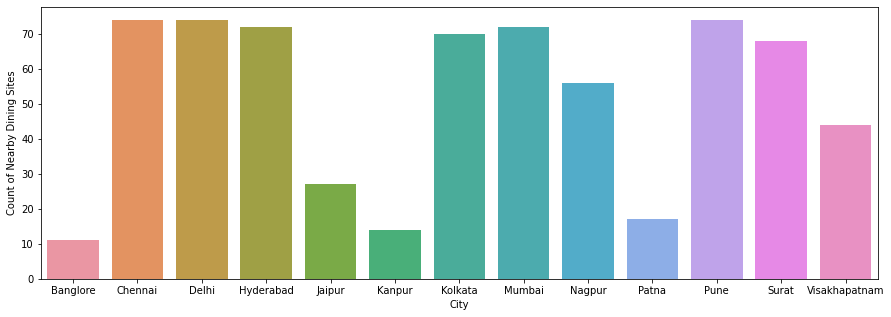

In [289]:
def func1(x):
    return str(x).split(',')[0]

venues_per_city = nearby_venues.groupby('Metro_City_Name').count()
bar_df = pd.DataFrame([venues_per_city.index,venues_per_city['id']]).transpose()
bar_df[0] = bar_df[0].apply(func1)
bar_df.columns = ['City', 'Count of Nearby Dining Sites']
bar_df.to_csv('Bar_df.csv')
bar_df

fig, ax = plt.subplots(figsize=(15,5))
sns.barplot(x ="City", y = "Count of Nearby Dining Sites", data = bar_df, ax = ax)

The dining sites are more concentrated in numnber in and around Surat compared to Patna wherein they are far from the city centre.

<i>Plots for Average Likes VS Dining Category</i>

In [290]:
cat_likes = nearby_venues.groupby('Category').mean()
likes_df = pd.DataFrame([cat_likes.index,cat_likes['Likes']]).transpose()
likes_df.columns = ['Dining Category', 'Average Likes']
likes_df.to_csv('Likes_df.csv')
likes_df.head()

,Dining Category,Average Likes
0,American Restaurant,112.5
1,Andhra Restaurant,7
2,Asian Restaurant,37.0833
3,Awadhi Restaurant,7
4,BBQ Joint,57.4444


[]

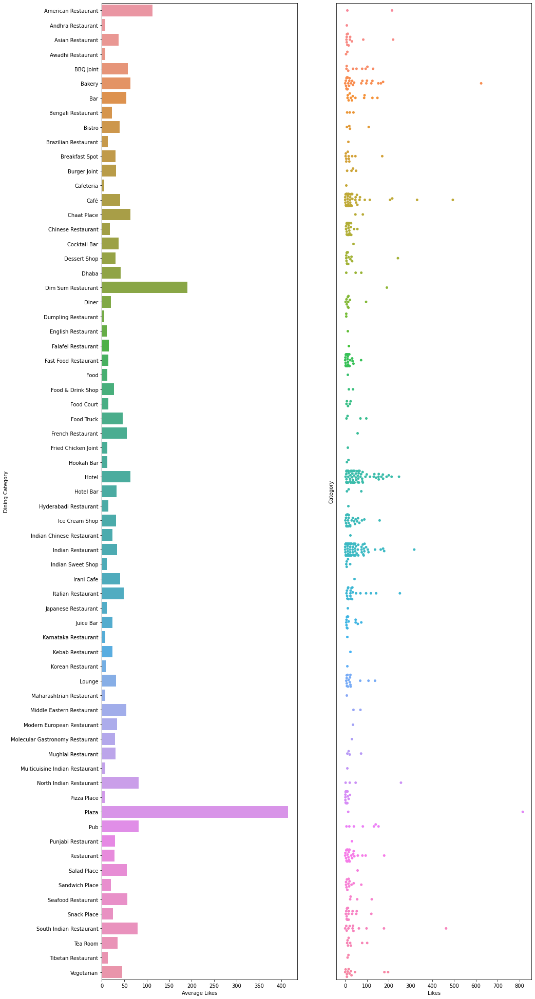

In [291]:
nearby_new = nearby_venues
nearby_new = nearby_new.sort_values(['Category'], ascending=[1])

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,35))
sns.barplot(x ="Average Likes", y = "Dining Category", data = likes_df, ax = ax1)
sns.swarmplot(x="Likes", y="Category", data=nearby_new, ax=ax2)
ax2.set_yticks([])

The plot on the right shows the averga likes for a dining site and that on the right depicts the number of likes or number of reviews. Although the category of German Restaurant has the highest average likes, but the number of likes in the dataset for this category is just one. Hence we dont have enough insights if we should consider building a German dining center. Moreover, Indian restaurants have huge number of reviews but teh average likes is not appealing.

<i>Plot depicting Average Likes VS Metro City</i>

<AxesSubplot:xlabel='Likes', ylabel='Metro_City_Name'>

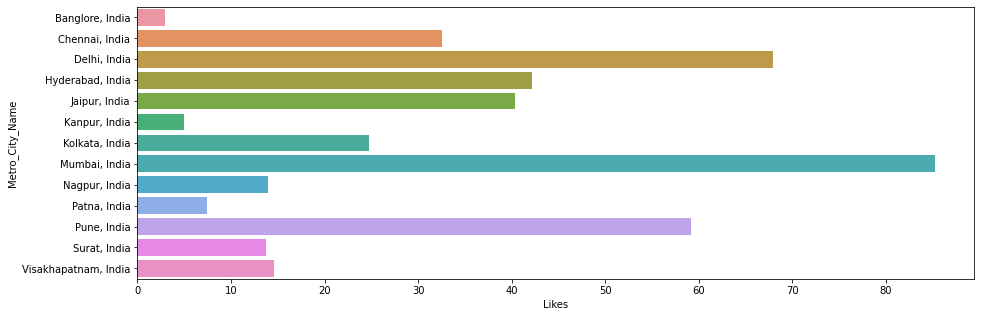

In [292]:
city_vs_avglikes = nearby_venues.groupby('Metro_City_Name').mean()

fig, ax = plt.subplots(figsize=(15,5))
sns.barplot(x ="Likes", y = city_vs_avglikes.index, data = city_vs_avglikes, ax = ax)

#### 3.2 Regression and Clustering Implementation

<i>Creating dummies for Regression Modelling via ONE HOT ENCODING</i>

In [346]:
reg_dataset = pd.get_dummies(nearby_venues[['categories_classified', 
                                          'Metro_City_Name',]], 
                               prefix="", 
                               prefix_sep="")

# add name, ranking, and likes columns back to dataframe
reg_dataset['Ranking_2'] = nearby_venues['ranking_2']
reg_dataset['Ranking_3'] = nearby_venues['ranking_3']
reg_dataset['Likes'] = nearby_venues['Likes']
reg_dataset['Venue_Name'] = nearby_venues['Venue_Name']

# move name column to the first column
reg_columns = [reg_dataset.columns[-1]] + list(reg_dataset.columns[:-1])
reg_dataset = reg_dataset[reg_columns]


reg_dataset.head()

,Venue_Name,american,asian,casual,euro,latino,regional,"Banglore, India","Chennai, India","Delhi, India","Hyderabad, India","Jaipur, India","Kanpur, India","Kolkata, India","Mumbai, India","Nagpur, India","Patna, India","Pune, India","Surat, India","Visakhapatnam, India",Ranking_2,Ranking_3,Likes
0,Amritsari Lassi Wala,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,7
1,Naturals Ice Cream,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,48
2,Connaught Place | कनॉट प्लेस (Connaught Place),0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,815
3,Karim's | करीम | کریم (Karim's),0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,317
4,The Imperial,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,114


In [395]:
reg_dataset.shape

(673, 23)

In [414]:
from sklearn.metrics import f1_score
X_2 = reg_dataset.iloc[:,1:20]
y_2 = reg_dataset.iloc[:,20]
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_2, y_2, test_size=0.2, random_state=42)

X_3 = reg_dataset.iloc[:,1:20]
y_3 = reg_dataset.iloc[:,21]
X_train3, X_test3, y_train3, y_test3 = train_test_split(X_3, y_3, test_size=0.2, random_state=42)

In [421]:
from sklearn.linear_model import LogisticRegression

model1 = LogisticRegression(multi_class='multinomial', solver='newton-cg')
model1.fit(X_train2, y_train2)
print("MultiClass Logistic Regression Model")
print("|")
print("-----------------------------------------------------------------------")
print("|")
print("Training Score with 2 Class Divisions", model1.score(X_train2, y_train2))
print("Testing Score with 2 Class Divisions", model1.score(X_test2, y_test2))
print("F1 Score with 2 Class Divisions", f1_score(y_test2, model1.predict(X_test2), average='weighted'))
print("|")
print("-----------------------------------------------------------------------")
print("|")
model1.fit(X_train3, y_train3)
print("Training Score with 3 Class Divisions", model1.score(X_train3, y_train3))
print("Testing Score with 3 Class Divisions", model1.score(X_test3, y_test3))
print("F1 Score with 3 Class Divisions", f1_score(y_test3, model1.predict(X_test3), average='weighted'))

MultiClass Logistic Regression Model
|
-----------------------------------------------------------------------
|
Training Score with 2 Class Divisions 0.7007434944237918
Testing Score with 2 Class Divisions 0.725925925925926
F1 Score with 2 Class Divisions 0.722307886676404
|
-----------------------------------------------------------------------
|
Training Score with 3 Class Divisions 0.5408921933085502
Testing Score with 3 Class Divisions 0.5185185185185185
F1 Score with 3 Class Divisions 0.45428875890435083


In [422]:
from sklearn.svm import SVC

model2 = SVC(gamma = 'auto', C = 3)
model2.fit(X_train2, y_train2)
print("SVM Classifier Model")
print("|")
print("-----------------------------------------------------------------------")
print("|")
print("Training Score with 2 Class Divisions", model2.score(X_train2, y_train2))
print("Testing Score with 2 Class Divisions", model2.score(X_test2, y_test2))
print("F1 Score with 2 Class Divisions", f1_score(y_test2, model2.predict(X_test2), average='weighted'))
print("|")
print("-----------------------------------------------------------------------")
print("|")
model2.fit(X_train3, y_train3)
print("Training Score with 3 Class Divisions", model2.score(X_train3, y_train3))
print("Testing Score with 3 Class Divisions", model2.score(X_test3, y_test3))
print("F1 Score with 3 Class Divisions", f1_score(y_test3, model2.predict(X_test3), average='weighted'))

SVM Classifier Model
|
-----------------------------------------------------------------------
|
Training Score with 2 Class Divisions 0.6970260223048327
Testing Score with 2 Class Divisions 0.725925925925926
F1 Score with 2 Class Divisions 0.722307886676404
|
-----------------------------------------------------------------------
|
Training Score with 3 Class Divisions 0.5353159851301115
Testing Score with 3 Class Divisions 0.5259259259259259
F1 Score with 3 Class Divisions 0.47485980688842083


In [423]:
from sklearn.tree import DecisionTreeClassifier

model3 = DecisionTreeClassifier(max_depth = 15)
model3.fit(X_train2, y_train2)
print("Decision Tree Classifier Model")
print("|")
print("-----------------------------------------------------------------------")
print("|")
print("Training Score with 2 Class Divisions", model3.score(X_train2, y_train2))
print("Testing Score with 2 Class Divisions", model3.score(X_test2, y_test2))
print("F1 Score with 2 Class Divisions", f1_score(y_test2, model3.predict(X_test2), average='weighted'))
print("|")
print("-----------------------------------------------------------------------")
print("|")
model3.fit(X_train3, y_train3)
print("Training Score with 3 Class Divisions", model3.score(X_train3, y_train3))
print("Testing Score with 3 Class Divisions", model3.score(X_test3, y_test3))
print("F1 Score with 3 Class Divisions", f1_score(y_test3, model3.predict(X_test3), average='weighted'))

Decision Tree Classifier Model
|
-----------------------------------------------------------------------
|
Training Score with 2 Class Divisions 0.7304832713754646
Testing Score with 2 Class Divisions 0.674074074074074
F1 Score with 2 Class Divisions 0.6733577533577534
|
-----------------------------------------------------------------------
|
Training Score with 3 Class Divisions 0.5762081784386617
Testing Score with 3 Class Divisions 0.5333333333333333
F1 Score with 3 Class Divisions 0.5213700722329446


In [425]:
from sklearn.ensemble import RandomForestClassifier

model4 = RandomForestClassifier(max_depth=15)
model4.fit(X_train2, y_train2)
print("Random Forest Classifier Model")
print("|")
print("-----------------------------------------------------------------------")
print("|")
print("Training Score with 2 Class Divisions", model4.score(X_train2, y_train2))
print("Testing Score with 2 Class Divisions", model4.score(X_test2, y_test2))
print("F1 Score with 2 Class Divisions", f1_score(y_test2, model4.predict(X_test2), average='weighted'))
print("|")
print("-----------------------------------------------------------------------")
print("|")
model4.fit(X_train3, y_train3)
print("Training Score with 3 Class Divisions", model4.score(X_train3, y_train3))
print("Testing Score with 3 Class Divisions", model4.score(X_test3, y_test3))
print("F1 Score with 3 Class Divisions", f1_score(y_test3, model4.predict(X_test3), average='weighted'))

Random Forest Classifier Model
|
-----------------------------------------------------------------------
|
Training Score with 2 Class Divisions 0.7304832713754646
Testing Score with 2 Class Divisions 0.6666666666666666
F1 Score with 2 Class Divisions 0.6650514839491217
|
-----------------------------------------------------------------------
|
Training Score with 3 Class Divisions 0.5762081784386617
Testing Score with 3 Class Divisions 0.5555555555555556
F1 Score with 3 Class Divisions 0.5497573515002708


<i>Extracting necessary encoded data and running K Means Clustering on it</i>

In [389]:
city_one_hot = reg_dataset.iloc[:,1:22]
k_num_clusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=k_num_clusters, random_state=0).fit(city_one_hot)
kmeans

KMeans(n_clusters=5, random_state=0)

### 4. RESULTS

#### 4.1 K-Means Clustering Results
<br>
K Means Clustering is implemented here with 5 clusters. The data used comprises ONE-HOT-ENCODED data of different dining venue category and city. The resulting clusters are plotted on a graph using Folium and are further analysed. With this a business owner, looking to open a new food centre in a different city can know which location to choose from and which location and category matches perfectly to his present location and category. Then he can choose the best location based on likes or demographics.

<i>Adding the Cluster Label to initial Dataframe</i>

In [391]:
nearby_venues.insert(0, 'Cluster Labels', kmeans.labels_)
nearby3 = nearby_venues
nearby3.head()

,Cluster Labels,index,id,Venue_Name,Category,Latitude,Longitude,Metro_City_Name,Likes,categories_classified,newLikes,ranking_2,ranking_3
0,1,0,5662936e498e19a9801a663f,Amritsari Lassi Wala,Snack Place,28.657325,77.224138,"Delhi, India",7,casual,-0.495028,0,0
1,2,1,54783eab498e910f8bd1781d,Naturals Ice Cream,Ice Cream Shop,28.634455,77.222139,"Delhi, India",48,casual,0.135247,1,2
2,2,2,4b489b54f964a520595026e3,Connaught Place | कनॉट प्लेस (Connaught Place),Plaza,28.632731,77.220018,"Delhi, India",815,casual,11.925996,1,2
3,3,3,4b42e3c7f964a520b5da25e3,Karim's | करीम | کریم (Karim's),Indian Restaurant,28.649498,77.233691,"Delhi, India",317,asian,4.270464,1,2
4,2,5,4bc8f2c7762beee1a8bb3d38,The Imperial,Hotel,28.625548,77.218664,"Delhi, India",114,casual,1.149835,1,2


In [392]:
def generateClusterMap(address):
    
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    print('The geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))
    
    x = np.arange(k_num_clusters)
    ys = [i + x + (i*x)**2 for i in range(k_num_clusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    map_gen = folium.Map(location=[latitude, longitude], zoom_start=11)

    # add markers to map
    for lat, lon, name, category, likes, cluster in zip(nearby3['Latitude'], nearby3['Longitude'], nearby3['Venue_Name'], nearby3['Category'], nearby3['Likes'], nearby3['Cluster Labels']):
        label = folium.Popup('Cluster ' + str(int(cluster) +1) + '\n' + 'Name: ' + str(name) + '\n' + 'Category: ' + str(category) + '\n' + 'Likes: ' + str(likes), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[int(cluster-1)],
            fill=True,
            fill_color=rainbow[int(cluster-1)]
            ).add_to(map_gen) 

    display(map_gen)

<i>Printing MAPS for each Metro City with Dining Sites clustered into 5 groups</i>

In [393]:
for address in address_list:
    print('CLUSTER MAP FOR {}'.format(address))
    generateClusterMap(address)

CLUSTER MAP FOR Delhi, India
The geograpical coordinate of Delhi, India are 28.6517178, 77.2219388.


CLUSTER MAP FOR Mumbai, India
The geograpical coordinate of Mumbai, India are 19.0759899, 72.8773928.


CLUSTER MAP FOR Kolkata, India
The geograpical coordinate of Kolkata, India are 22.5726723, 88.3638815.


CLUSTER MAP FOR Chennai, India
The geograpical coordinate of Chennai, India are 13.0836939, 80.270186.


CLUSTER MAP FOR Banglore, India
The geograpical coordinate of Banglore, India are 12.5287523, 78.210298.


CLUSTER MAP FOR Hyderabad, India
The geograpical coordinate of Hyderabad, India are 17.360589, 78.4740613.


CLUSTER MAP FOR Pune, India
The geograpical coordinate of Pune, India are 18.521428, 73.8544541.


CLUSTER MAP FOR Visakhapatnam, India
The geograpical coordinate of Visakhapatnam, India are 17.7231276, 83.3012842.


CLUSTER MAP FOR Kanpur, India
The geograpical coordinate of Kanpur, India are 26.4609135, 80.3217588.


CLUSTER MAP FOR Surat, India
The geograpical coordinate of Surat, India are 21.1864607, 72.8081281.


CLUSTER MAP FOR Patna, India
The geograpical coordinate of Patna, India are 25.6093239, 85.1235252.


CLUSTER MAP FOR Jaipur, India
The geograpical coordinate of Jaipur, India are 26.9154576, 75.8189817.


CLUSTER MAP FOR Nagpur, India
The geograpical coordinate of Nagpur, India are 21.1498134, 79.0820556.


#### 4.1 K-Means Use Case
<br>
Consider an existing owner of a dining site in one of teh metro cities who aims to expand to a different metro city. Thus he can check the cluster label for his restuarant and get the list of restuarants with similar cluster labels and depending on category of resturant and likes he can decide on a new location for expansion.

#### 4.3 LOGISTIC REGRESSION RESULTS
<br>
A multinomial ordinal logisitc regression model was trained on a random subsample of 80% of the sample and then tested on the other 20%. To see if this is a reasonable model, its accuracy score for 2 Class and 3 Class divisions were calculated (73% and 52% respectively). Although this is not a perfect prediction, an accuracy of 72% between the training set and test set is a reasonable result.

#### 4.4 SVM Results
<br>
The SVM is implemented with a sigmoid kernel and default value of gamma parameter. The model is trained with 80 percent of training data. To see if this is a reasonable model, its accuracy score for 2 Class and 3 Class divisions were calculated (73% and 53% respectively) Thus, we can now predict the rank of a dining location and hence have an idea of the range in which the total likes for that location would lie. Although this is not a perfect prediction, an accuracy of 73% between the training set and test set is a reasonable result.

#### 4.4 DECISION TREE  Results
<br>
The DECISION TREE is implemented with max depth of 15 and default values for all other parameters. The model is trained with 80 percent of training data. To see if this is a reasonable model, its accuracy score for 2 Class and 3 Class divisions were calculated (67% and 53% respectively).

#### 4.4 RANDOM FOREST CLASSIFIER  Results
<br>
The RANDOM FOREST CLASSIFIER is implemented with max depth of 15 and default values for all other parameters. The model is trained with 80 percent of training data. To see if this is a reasonable model, its accuracy score for 2 Class and 3 Class divisions were calculated (67% and 55% respectively).

#### 4.4 ACCURACY SCORE ANALYSIS
<br>
For a 2 Class Division the SVM model performed the best with an overall test accuracy of 73%
<br>
For a 3 Class Division the Random Forest Classifier model performed the best with an overall test accuracy of 55%

### 5. DISCUSSIONS

<div style = "text-align: justify">
The clustering gives insights on whihc categpry of restaurant or which city to choose depending on the present city and category of the business owner. The first thing to note is that given the data, SVM presents a better fit for the data over linear regression. Using SVM Classifier we were able to obtain a Accuracy Score of 73%, which although not perfect, is more reasonable than the low variance score obtained from the linear regression. As stated before, please note that for the purposes of this project, we are assumming that likes are a good proxy for how well a new restaurant will do in terms of brand, image and by extension how well the restaurant will perform business-wise. Whether or not these assumptions hold up in a real-life scenario is up for discussion, but this project does contain limitations in scope due to the amount of data that can be fetched from the FourSquare API.
</div>
<br>
<div style = "text-align: justify">
As such, to obtain insights into this data, we can proceed with breaking down the results of the SVM model. The results showed that the model is better at predicting if a restaurant will fall into the best or worst percentile of likes. This allows us to roughly predict the potential performance of the business opportunity. Different binning methods for the classes were attempted, but the use of 3 bins yielded the best Accuracy Score.
</div>
<br>


### 6. CONCLUSIONS

In conclusion, after analyzing restaurant "likes" in metro cities of INDIA from 486 restaurants, we have developed a general classification model for which "ranking" of likes a new restaurant will potentially fall into based on its characteristics